In [7]:
import os

# Get the current notebook's filename
notebook_filename = os.path.basename(os.getenv('JUPYTER_RUNTIME_DIR', ''))

# Construct the notebook path
notebook_path = os.path.join(os.getcwd(), notebook_filename)

print("Full path to the current .ipynb file:", notebook_path)


Full path to the current .ipynb file: C:\Users\sindr\


In [2]:
#pip install numpy

In [3]:
#pip install matplotlib

In [1]:
# Part 1: Preparation
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pandas as pd

In [2]:
diamonds = sns.load_dataset("diamonds")
diamonds_df = pd.DataFrame(diamonds)
diamonds_df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [3]:
clarity_df = pd.DataFrame(diamonds['clarity'])
clarity_df

,clarity
0,SI2
1,SI1
2,VS1
3,VS2
4,SI2
...,...
53935,SI1
53936,SI1
53937,SI1
53938,SI2


In [4]:
from sklearn.model_selection import train_test_split

X = diamonds.drop(columns=['clarity'])  
y = diamonds['clarity'] 

# Divide the data into training (70%), validation (15%) and test (15%) samples
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


print("Train set size:", X_train.shape, y_train.shape)
print("Validation set size:", X_val.shape, y_val.shape)
print("Test set size:", X_test.shape, y_test.shape)


Train set size: (37758, 9) (37758,)
Validation set size: (8091, 9) (8091,)
Test set size: (8091, 9) (8091,)


In [5]:
train_data = pd.DataFrame(X_train, columns=diamonds.columns[:-1])  
train_data['clarity'] = y_train  

val_data = pd.DataFrame(X_val, columns=diamonds.columns[:-1])
val_data['clarity'] = y_val

test_data = pd.DataFrame(X_test, columns=diamonds.columns[:-1])
test_data['clarity'] = y_test

In [6]:
print("Count of NaN values:")
print(diamonds.isna().sum())

# There is no NaN values :)

Count of NaN values:
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64


In [7]:
print("Train data:")
train_data

Train data:


,carat,cut,color,clarity,depth,table,price,x,y
19497,1.21,Ideal,H,VVS2,61.3,57.0,8131,6.92,6.87
31229,0.31,Ideal,E,VS2,62.0,56.0,756,4.38,4.36
22311,1.21,Ideal,E,VS1,62.4,57.0,10351,6.75,6.83
278,0.81,Ideal,F,SI2,62.6,55.0,2795,5.92,5.96
6646,0.79,Ideal,I,VVS2,61.7,56.0,4092,5.94,5.95
...,...,...,...,...,...,...,...,...,...
11284,1.05,Very Good,I,VS2,62.4,59.0,4975,6.48,6.51
44732,0.47,Ideal,D,VS1,61.0,55.0,1617,5.03,5.01
38158,0.33,Very Good,F,IF,60.3,58.0,1014,4.49,4.46
860,0.90,Premium,J,SI1,62.8,59.0,2871,6.13,6.03


In [8]:
import pandas as pd

numeric_cols = diamonds.select_dtypes(include=[np.number]).columns

means = X_train[numeric_cols].mean(axis=0) 
stds = X_train[numeric_cols].std(axis=0)  

X_train_normalized = (X_train[numeric_cols] - means) / stds

mean_df = pd.DataFrame(means, columns=['mean']).T
std_df = pd.DataFrame(stds, columns=['standard_deviation']).T

In [9]:
mean_df

,carat,depth,table,price,x,y,z
mean,0.799763,61.744923,57.461129,3951.495312,5.735377,5.738825,3.541152


In [10]:
std_df

,carat,depth,table,price,x,y,z
standard_deviation,0.475556,1.42863,2.226637,4006.428295,1.122262,1.146605,0.711444


In [11]:
X_train_normalized

,carat,depth,table,price,x,y,z
19497,0.862648,-0.311433,-0.207097,1.043200,1.055567,0.986543,0.968240
31229,-1.029875,0.178547,-0.656204,-0.797592,-1.207718,-1.202528,-1.168261
22311,0.862648,0.458535,-0.207097,1.597309,0.904087,0.951657,0.982296
278,0.021526,0.598529,-1.105312,-0.288660,0.164510,0.192895,0.251388
6646,-0.020530,-0.031445,-0.656204,0.035070,0.182331,0.184174,0.181108
...,...,...,...,...,...,...,...
11284,0.526199,0.458535,0.691119,0.255466,0.663502,0.672572,0.715233
44732,-0.693427,-0.521425,-1.105312,-0.582687,-0.628531,-0.635637,-0.676304
38158,-0.987819,-1.011404,0.242011,-0.733196,-1.109702,-1.115314,-1.182317
860,0.210779,0.738524,0.691119,-0.269690,0.351632,0.253945,0.391947


In [12]:
X_val_normalized = (X_val[numeric_cols] - means) / stds
X_test_normalized = (X_test[numeric_cols] - means) / stds

val_data_normalized = pd.concat([X_val_normalized, pd.DataFrame(y_val, columns=['clarity'])], axis=1)
test_data_normalized = pd.concat([X_test_normalized, pd.DataFrame(y_test, columns=['clarity'])], axis=1)

In [13]:
print("Normalized Validation data:")
val_data_normalized

Normalized Validation data:


,carat,depth,table,price,x,y,z,clarity
12640,0.547227,-1.151399,0.242011,0.334838,0.770429,0.785950,0.616842,SI2
39960,-0.630342,1.648486,-0.207097,-0.710482,-0.655263,-0.687966,-0.493576,VVS2
47178,-0.609314,-0.031445,-1.554420,-0.528025,-0.503783,-0.522259,-0.507632,VS1
2294,-0.188754,0.458535,0.691119,-0.197307,-0.004791,-0.051304,0.026493,VS2
33566,-0.777539,-1.151399,0.242011,-0.779122,-0.753279,-0.705409,-0.830919,SI1
...,...,...,...,...,...,...,...,...
49119,-0.209782,-0.591422,2.038442,-0.470618,-0.058255,-0.016418,-0.100010,SI1
2791,-0.041558,0.528532,0.242011,-0.173096,0.111046,0.131846,0.181108,SI1
33036,-1.008847,-0.101442,-1.105312,-0.783115,-1.163166,-1.106593,-1.126093,VVS1
9294,1.367320,-2.201355,4.733089,0.154378,1.527827,1.387727,1.122855,SI2


In [14]:
print("Normalized Test data:")
test_data_normalized

Normalized Test data:


,carat,depth,table,price,x,y,z,clarity
51133,-0.567258,-0.101442,-0.656204,-0.402227,-0.450320,-0.478652,-0.465465,VS1
44604,-0.567258,0.038552,-0.656204,-0.585183,-0.468141,-0.487374,-0.465465,VS2
96,-0.209782,-1.641379,2.038442,-0.297645,-0.022612,0.018467,-0.198402,VS1
9035,-0.924735,-0.241436,-0.207097,-0.839774,-1.020596,-0.967051,-0.999590,VS2
31219,-1.008847,0.668526,-1.554420,-0.797592,-1.189897,-1.193807,-1.112037,SI1
...,...,...,...,...,...,...,...,...
36971,-0.798567,-0.241436,-1.554420,-0.746175,-0.824564,-0.731573,-0.788751,VVS2
5854,0.421059,-0.171439,0.242011,-0.007861,0.601128,0.559194,0.546562,SI2
18238,0.547227,-0.311433,0.242011,0.862740,0.734786,0.681294,0.659010,VS2
21504,0.463115,0.388538,0.242011,1.409361,0.610038,0.620244,0.659010,VVS2


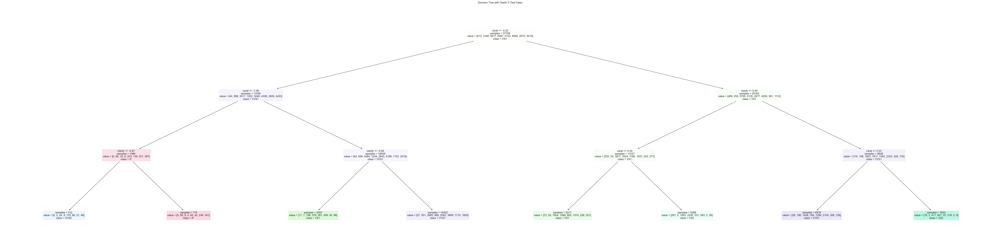

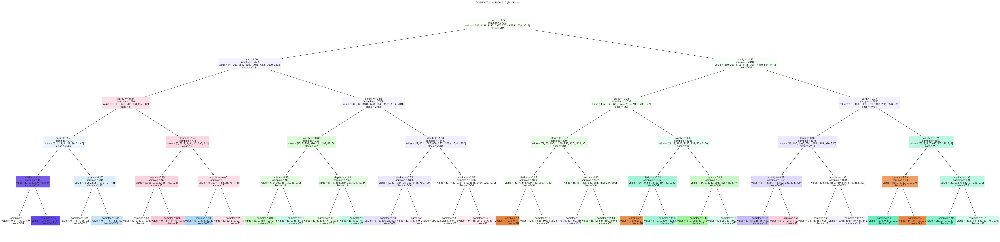

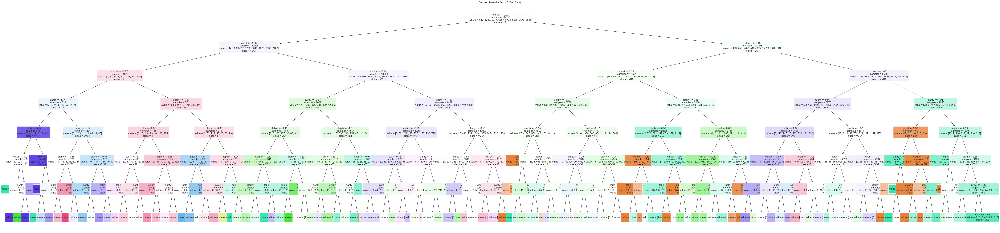

In [15]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

train_accuracies = []
val_accuracies = []
test_accuracies = []

depths = [3, 5, 7]

for depth in depths:
    dt_classifier = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt_classifier.fit(X_train_normalized, y_train)
    
    train_pred = dt_classifier.predict(X_train_normalized)
    val_pred = dt_classifier.predict(X_val_normalized)
    test_pred = dt_classifier.predict(X_test_normalized)
    
    train_accuracy = accuracy_score(y_train, train_pred)
    val_accuracy = accuracy_score(y_val, val_pred)
    test_accuracy = accuracy_score(y_test, test_pred)
    
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    test_accuracies.append(test_accuracy)
    
    class_names_list = list(diamonds['clarity'].unique())
    feature_names_list = list(diamonds.columns)
    width_multiplier = 0.7 * depth + 80
    width = width_multiplier
    
    plt.figure(figsize=(width, 20))
    plot_tree(dt_classifier, filled=True, feature_names=feature_names_list, class_names=class_names_list, 
              impurity=False, node_ids=False,
              proportion=False, precision=2, fontsize=12)
    
    plt.title(f'Decision Tree with Depth {depth} (Test Data)')
    plt.show()
    plt.close()

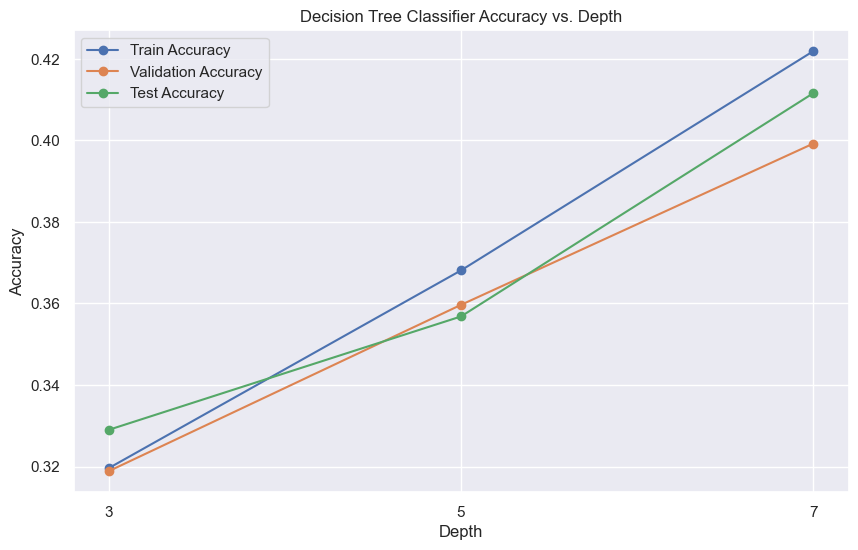

In [16]:
plt.figure(figsize=(10, 6))
plt.plot(depths, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(depths, val_accuracies, marker='o', label='Validation Accuracy')
plt.plot(depths, test_accuracies, marker='o', label='Test Accuracy')
plt.title('Decision Tree Classifier Accuracy vs. Depth')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.xticks(depths)
plt.legend()
plt.grid(True)
plt.show()

In [17]:
train_accuracies

[0.3196143863552095, 0.3681074209439059, 0.421870861804121]

In [18]:
val_accuracies

[0.3188728216536893, 0.3596588802373007, 0.3992089976517118]

In [19]:
test_accuracies

[0.32900753924113213, 0.3568162155481399, 0.41156840934371525]

In [20]:
# Part 3: Noise
import numpy as np

noise = np.random.uniform(low=-0.1, high=0.1, size=X_train_normalized.shape)
X_train_noisy = X_train_normalized + noise

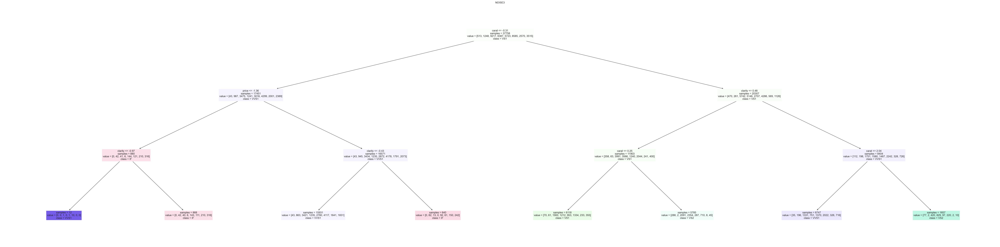

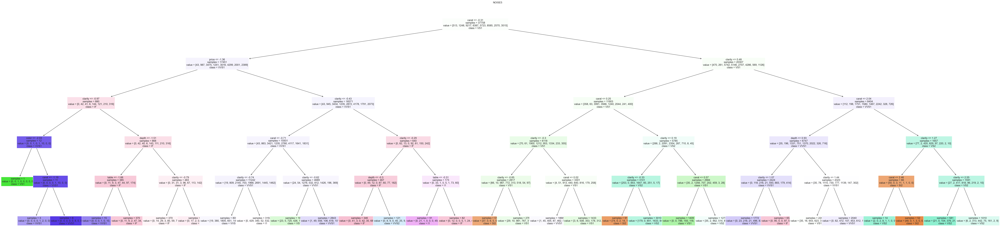

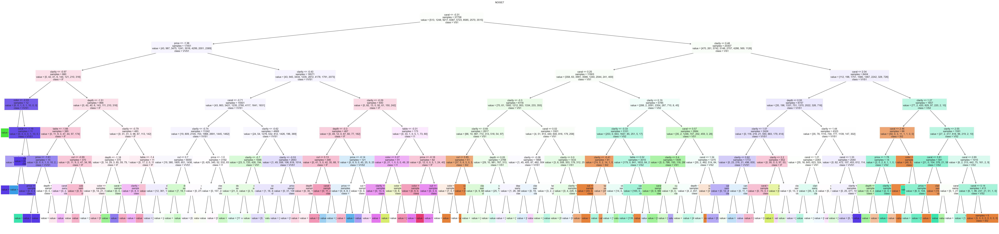

In [21]:
train_accuracies_noise = []
val_accuracies_noise = []
test_accuracies_noise = []

depths = [3,5,7]

for depth in depths:
    dt_classifier_n = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt_classifier_n.fit(X_train_noisy, y_train)
    
    train_pred_n = dt_classifier_n.predict(X_train_noisy)
    test_pred_n = dt_classifier_n.predict(X_test_normalized)
    val_pred_n = dt_classifier_n.predict(X_val_normalized)
    
    train_accuracy_noise = accuracy_score(y_train, train_pred_n)
    val_accuracy_noise = accuracy_score(y_val, val_pred_n)
    test_accuracy_noise = accuracy_score(y_test, test_pred_n)
    
    train_accuracies_noise.append(train_accuracy_noise)
    val_accuracies_noise.append(val_accuracy_noise)
    test_accuracies_noise.append(test_accuracy_noise)
    
    class_names_list = list(diamonds['clarity'].unique())
    feature_names_list = list(diamonds.columns)
    
    width_multiplier = 0.7 * depth + 80
    width = width_multiplier
    plt.figure(figsize=(width, 20))
    plot_tree(dt_classifier_n, filled=True, feature_names=feature_names_list, class_names=class_names_list, 
              impurity=False, node_ids=False,
              proportion=False, precision=2, fontsize=12)
    
    plt.title(f'NOISE{depth}')
    plt.savefig(f"C:/Users/sindr/Desktop/noise_{depth}.png")
    plt.show()
    plt.close()

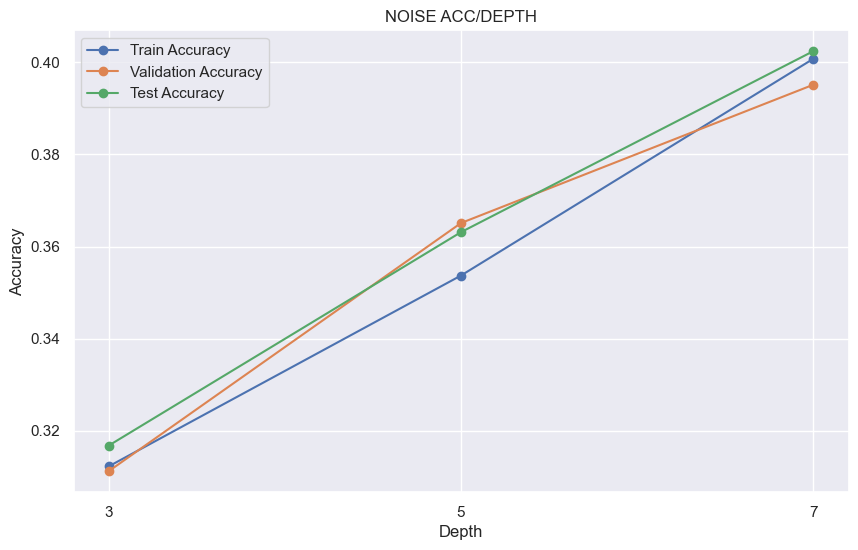

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(depths, train_accuracies_noise, marker='o', label='Train Accuracy')
plt.plot(depths, val_accuracies_noise, marker='o', label='Validation Accuracy')
plt.plot(depths, test_accuracies_noise, marker='o', label='Test Accuracy')
plt.title('NOISE ACC/DEPTH')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.xticks(depths)
plt.legend()
plt.grid(True)
plt.show()

In [36]:
print("Train accuracy d=3:", train_accuracies[0])
print("Train accuracy d=3 + NOISE:", train_accuracies[0])
print("\nVal accuracy d=3:", val_accuracies[0])
print("Val accuracy d=3 + NOISE:", val_accuracies_noise[0])
print("------------------------------------------")
print("\nTrain accuracy d=5:", train_accuracies[1])
print("Train accuracy d=5 + NOISE:", train_accuracies_noise[1])
print("\nVal accuracy d=5:", val_accuracies[1])
print("Val accuracy d=5 + NOISE:", val_accuracies_noise[1])
print("------------------------------------------")
print("\nTrain accuracy d=7:", train_accuracies[2])
print("Train accuracy d=7 + NOISE:", train_accuracies_noise[2])
print("\nVal accuracy d=7:", val_accuracies[2])
print("Val accuracy d=7 + NOISE:", val_accuracies_noise[2])


Train accuracy d=3: 0.3196143863552095
Train accuracy d=3 + NOISE: 0.3196143863552095

Val accuracy d=3: 0.3188728216536893
Val accuracy d=3 + NOISE: 0.31120998640464714
------------------------------------------

Train accuracy d=5: 0.3681074209439059
Train accuracy d=5 + NOISE: 0.3536998781715133

Val accuracy d=5: 0.3596588802373007
Val accuracy d=5 + NOISE: 0.36509702138178224
------------------------------------------

Train accuracy d=7: 0.421870861804121
Train accuracy d=7 + NOISE: 0.40076275226442076

Val accuracy d=7: 0.3992089976517118
Val accuracy d=7 + NOISE: 0.39513039179335063


In [24]:
# Part 4: Noise reduction
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

pca = PCA(n_components=0.95)
pca.fit(X_train_normalized)
X_train_pca = pca.transform(X_train_normalized)

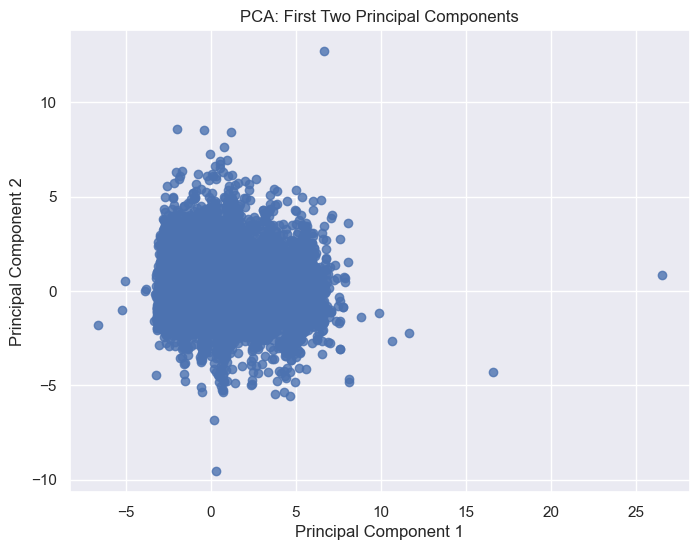

In [25]:
plt.figure(figsize=(8, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], alpha=0.8)
plt.title('PCA: First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [26]:
pca_n = PCA(n_components=0.95)
X_train_noisy_pca = pca_n.fit_transform(X_train_noisy)

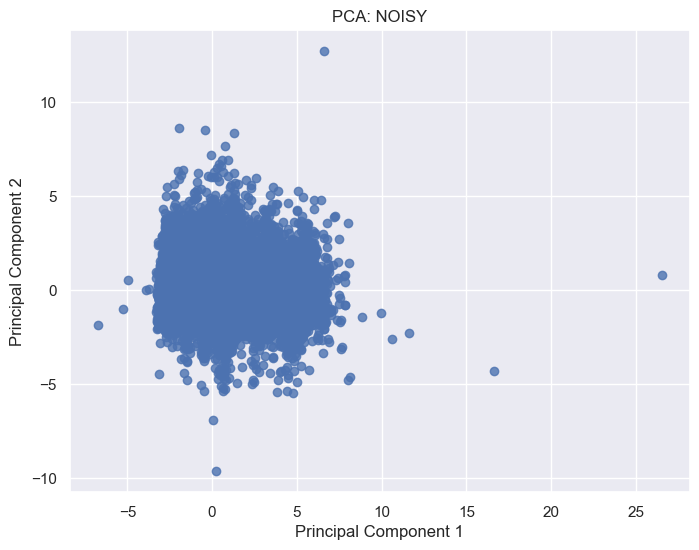

In [27]:
plt.figure(figsize=(8, 6))
plt.scatter(X_train_noisy_pca[:, 0], X_train_noisy_pca[:, 1], alpha=0.8)
plt.title('PCA: NOISY')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [28]:
print("Correspondence between column names and their contributions in pca.components_:\n")
for i, component in enumerate(pca.components_):
    print(f"PC {i+1}:")
    for feature, value in zip(X_train.columns, component):
        print(f"{feature}: {value}")
    print()

print("-----------------------------------------------------")

print("\nCorrespondence between column names and their contributions in NOISY:\n")
for i, component in enumerate(pca_n.components_):
    print(f"Noisy PC {i+1}:")
    for feature, value in zip(X_train.columns, component):
        print(f"{feature}: {value}")
    print()

print("-----------------------------------------------------")

print("\nExplained variance ratio for each principal component:")
print("PCA:")
print(pca.explained_variance_ratio_)
print("\nNoisy PCA:")
print(pca_n.explained_variance_ratio_)


Correspondence between column names and their contributions in pca.components_:

PC 1:
carat: 0.45304086873489496
cut: 0.0018459633783532428
color: 0.09742651584418373
depth: 0.4262776471187718
table: 0.45377026865530856
price: 0.4471295541497819
x: 0.4446500987774444

PC 2:
carat: -0.03388038329198464
cut: -0.7294187776794983
color: 0.6766324598221486
depth: -0.03604041966424693
table: 0.005711885683504727
price: 0.005221041320656171
x: -0.08723579512708353

PC 3:
carat: -0.005723553729354139
cut: 0.6741624089241449
color: 0.726808780172456
depth: -0.10498049222771191
table: -0.039592604522123126
price: -0.0549833006563348
x: 0.040120355908755845

-----------------------------------------------------

Correspondence between column names and their contributions in NOISY:

Noisy PC 1:
carat: 0.45299719771786184
cut: 0.0020385181580295925
color: 0.09754123072168618
depth: 0.4262340121047771
table: 0.45372181213128127
price: 0.44723106242899546
x: 0.44465779261448374

Noisy PC 2:
carat: -

In [29]:
X_train_denoised = pca_n.inverse_transform(X_train_noisy_pca)

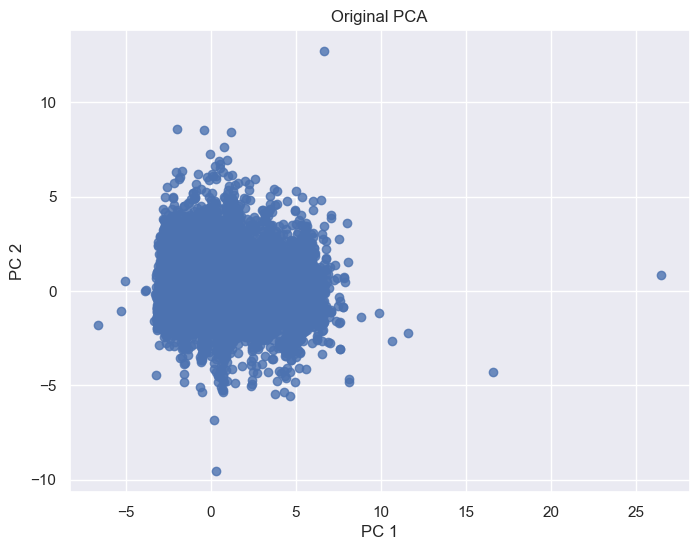

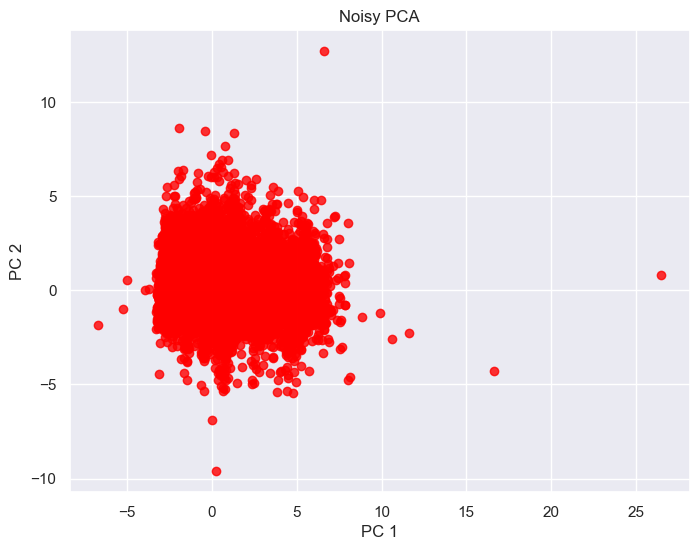

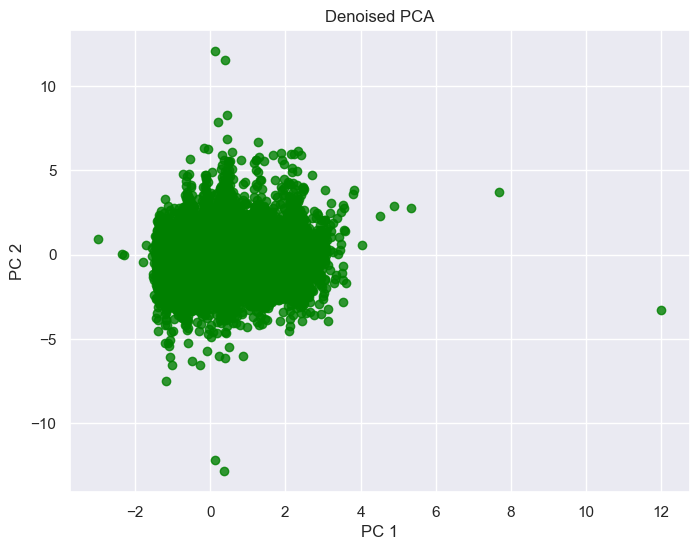

In [30]:
plt.figure(figsize=(8, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], alpha=0.8)
plt.title('Original PCA')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.scatter(X_train_noisy_pca[:, 0], X_train_noisy_pca[:, 1], alpha=0.8, c="red")
plt.title('Noisy PCA')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.scatter(X_train_denoised[:, 0], X_train_denoised[:, 1], alpha=0.8, c="green")
plt.title('Denoised PCA')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.grid(True)
plt.show()


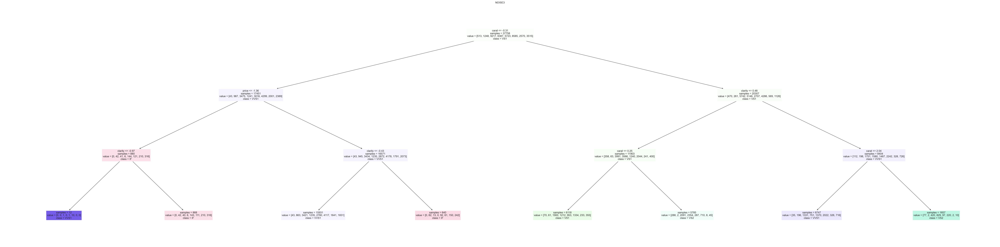

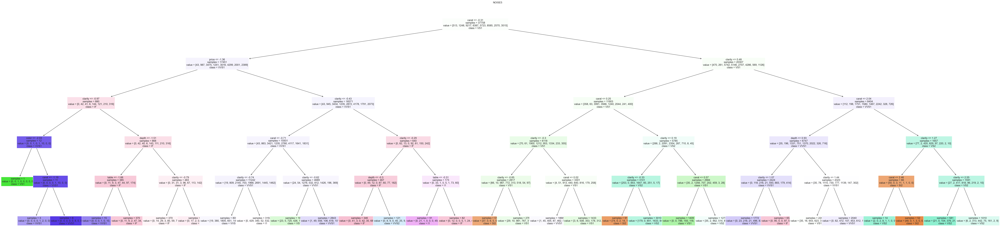

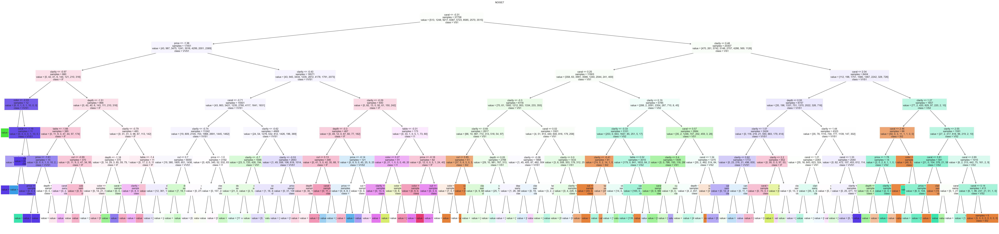

In [31]:
# Part 5: Noisy and Denoised Desition trees
train_accuracies_noise = []
val_accuracies_noise = []

depths = [3,5,7]

for depth in depths:
    dt_classifier_n = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt_classifier_n.fit(X_train_noisy, y_train)
    
    train_pred_n = dt_classifier_n.predict(X_train_noisy)
    val_pred_n = dt_classifier_n.predict(X_val_normalized)
    
    train_accuracy_noise = accuracy_score(y_train, train_pred_n)
    val_accuracy_noise = accuracy_score(y_val, val_pred_n)
    
    train_accuracies_noise.append(train_accuracy_noise)
    val_accuracies_noise.append(val_accuracy_noise)
    
    class_names_list = list(diamonds['clarity'].unique())
    feature_names_list = list(diamonds.columns)
    
    width_multiplier = 0.7 * depth + 80
    width = width_multiplier
    plt.figure(figsize=(width, 20))
    plot_tree(dt_classifier_n, filled=True, feature_names=feature_names_list, class_names=class_names_list, 
              impurity=False, node_ids=False,
              proportion=False, precision=2, fontsize=12)
    
    plt.title(f'NOISE{depth}')
    plt.savefig(f"C:/Users/sindr/Desktop/noise_{depth}.png")
    plt.show()
    plt.close()

In [32]:
print(train_accuracies_noise)
print(val_accuracies_noise)

[0.31225170824725884, 0.3536998781715133, 0.40076275226442076]
[0.31120998640464714, 0.36509702138178224, 0.39513039179335063]


C:\Users\sindr\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


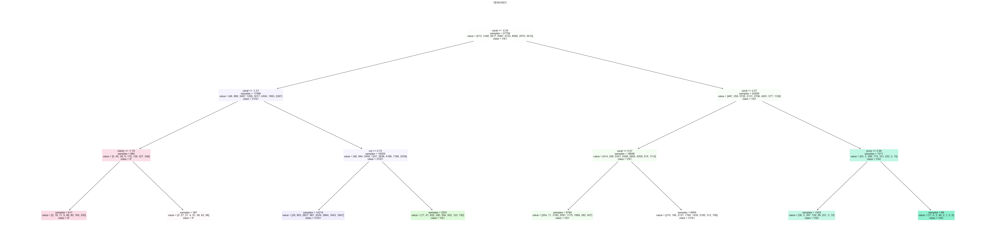

C:\Users\sindr\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


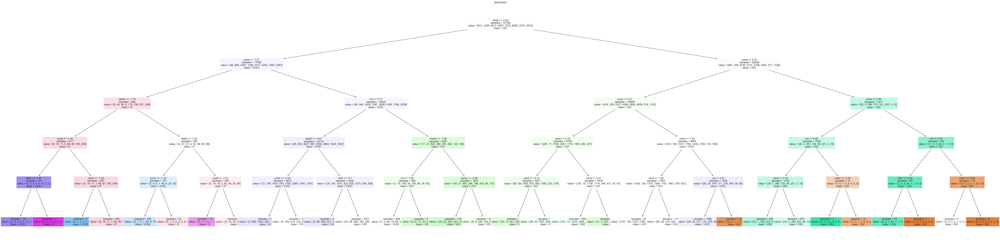

C:\Users\sindr\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


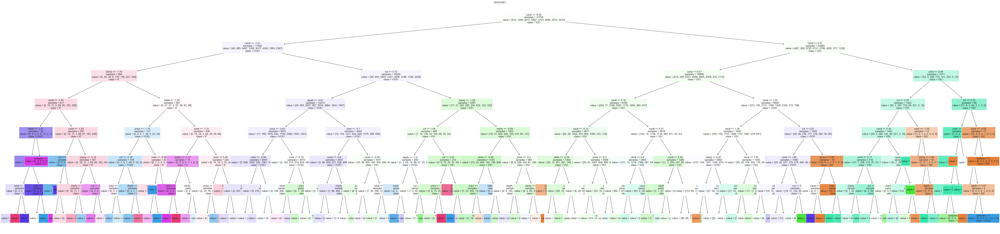

In [33]:
train_accuracies_denoise = []
val_accuracies_denoise = []

depths = [3,5,7]

for depth in depths:
    dt_classifier_dn = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt_classifier_dn.fit(X_train_denoised, y_train)
    
    train_pred_dn = dt_classifier_dn.predict(X_train_denoised)
    val_pred_dn = dt_classifier_dn.predict(X_val_normalized)
    
    train_accuracy_denoise = accuracy_score(y_train, train_pred_dn)
    val_accuracy_denoise = accuracy_score(y_val, val_pred_dn)
    
    train_accuracies_denoise.append(train_accuracy_denoise)
    val_accuracies_denoise.append(val_accuracy_denoise)
    
    class_names_list = list(diamonds['clarity'].unique())
    feature_names_list = list(diamonds.columns)
    
    width_multiplier = 0.7 * depth + 80
    width = width_multiplier
    plt.figure(figsize=(width, 20))
    plot_tree(dt_classifier_dn, filled=True, feature_names=feature_names_list, class_names=class_names_list, 
              impurity=False, node_ids=False,
              proportion=False, precision=2, fontsize=12)
    
    plt.title(f'DENOISE{depth}')
    plt.savefig(f"C:/Users/sindr/Desktop/denoise_{depth}.png")
    plt.show()
    plt.close()

In [34]:
print("Noisy Train accuracy d=3:", train_accuracies_noise[0])
print("Denoised Train accuracy d=3:", train_accuracies_denoise[0])
print("\nNoisy Val accuracy d=3:", val_accuracies_noise[0])
print("Denoised Val accuracy d=3:", val_accuracies_denoise[0])
print("------------------------------------------")
print("\nNoisy Train accuracy d=5:", train_accuracies_noise[1])
print("Denoised Train accuracy d=5:", train_accuracies_denoise[1])
print("\nNoisy Val accuracy d=5:", val_accuracies_noise[1])
print("Denoised Val accuracy d=5:", val_accuracies_denoise[1])
print("------------------------------------------")
print("\nNoisy Train accuracy d=7:", train_accuracies_noise[2])
print("Denoised Train accuracy d=7:", train_accuracies_denoise[2])
print("\nNoisy Val accuracy d=7:", val_accuracies_noise[2])
print("Denoised Val accuracy d=7:", val_accuracies_denoise[2])

Noisy Train accuracy d=3: 0.31225170824725884
Denoised Train accuracy d=3: 0.29064039408866993

Noisy Val accuracy d=3: 0.31120998640464714
Denoised Val accuracy d=3: 0.2731429983932765
------------------------------------------

Noisy Train accuracy d=5: 0.3536998781715133
Denoised Train accuracy d=5: 0.30332644737539066

Noisy Val accuracy d=5: 0.36509702138178224
Denoised Val accuracy d=5: 0.27400815721171673
------------------------------------------

Noisy Train accuracy d=7: 0.40076275226442076
Denoised Train accuracy d=7: 0.3199321997987182

Noisy Val accuracy d=7: 0.39513039179335063
Denoised Val accuracy d=7: 0.2705475219379557


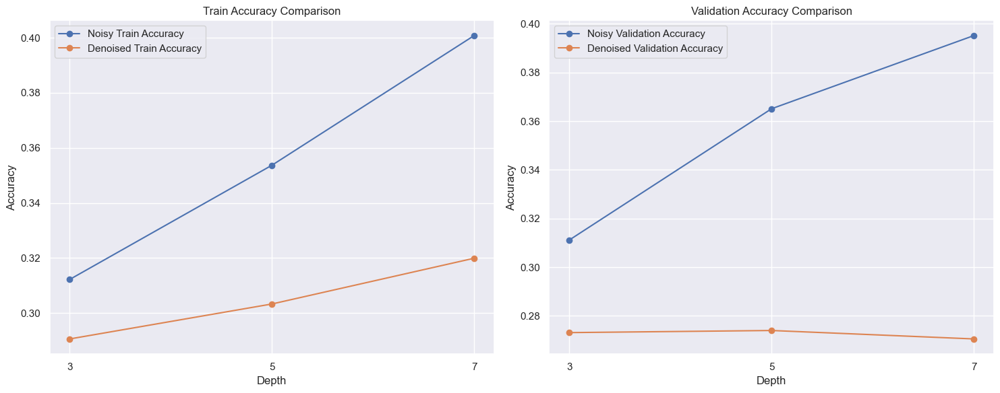

In [35]:
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.plot(depths, train_accuracies_noise, marker='o', label='Noisy Train Accuracy')
plt.plot(depths, train_accuracies_denoise, marker='o', label='Denoised Train Accuracy')
plt.title('Train Accuracy Comparison')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.xticks(depths)
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(depths, val_accuracies_noise, marker='o', label='Noisy Validation Accuracy')
plt.plot(depths, val_accuracies_denoise, marker='o', label='Denoised Validation Accuracy')
plt.title('Validation Accuracy Comparison')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.xticks(depths)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()